In [3]:
import zipfile
import os

# Path to your CUAD zip file
zip_path = "/Users/michaelpancras/Desktop/AI_Legal_Assistant/CUAD_v1.zip"

# Destination folder to extract contents
extract_path = "/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data"

# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# List the extracted files and folders
print("Contents of CUAD dataset:")
for root, dirs, files in os.walk(extract_path):
    for name in files:
        print(os.path.join(root, name))

Contents of CUAD dataset:
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/CUAD_v1_README.txt
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/master_clauses.csv
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/CUAD_v1.json
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/full_contract_txt/LIMEENERGYCO_09_09_1999-EX-10-DISTRIBUTOR AGREEMENT.txt
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/full_contract_txt/WHITESMOKE,INC_11_08_2011-EX-10.26-PROMOTION AND DISTRIBUTION AGREEMENT.txt
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/full_contract_txt/LohaCompanyltd_20191209_F-1_EX-10.16_11917878_EX-10.16_Supply Agreement.txt
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/full_contract_txt/CENTRACKINTERNATIONALINC_10_29_1999-EX-10.3-WEB SITE HOSTING AGREEMENT.txt
/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1/full_contract_txt/NELNETINC_04_0

In [24]:
import os
import json
import pandas as pd
import re
import nltk
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split

nltk.download('stopwords')
STOPWORDS = set(stopwords.words('english'))

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^a-z0-9\s]', ' ', text)
    tokens = text.split()
    tokens = [t for t in tokens if t not in STOPWORDS]
    return ' '.join(tokens)

def load_cuad_jsons(json_folder):
    data = []
    for root, dirs, files in os.walk(json_folder):
        for filename in files:
            if filename.endswith('.json'):
                filepath = os.path.join(root, filename)
                with open(filepath, 'r', encoding='utf-8') as f:
                    doc = json.load(f)

                for contract in doc.get('data', []):
                    for paragraph in contract.get('paragraphs', []):
                        for qa in paragraph.get('qas', []):
                            label = qa.get('question', 'Unknown')
                            for answer in qa.get('answers', []):
                                clause_text = answer.get('text', '').strip()
                                if clause_text:
                                    cleaned_text = clean_text(clause_text)
                                    data.append({'clause_text': cleaned_text, 'label': label})

    df = pd.DataFrame(data)
    return df

def prepare_train_test(df, test_size=0.2, random_state=42):
    df = df.dropna(subset=['clause_text', 'label'])
    df = df[df['clause_text'].str.strip() != '']
    df['label'] = df['label'].astype('category')
    df['label_id'] = df['label'].cat.codes

    X_train, X_test, y_train, y_test = train_test_split(
        df['clause_text'], df['label_id'], test_size=test_size, random_state=random_state, stratify=df['label_id']
    )
    return X_train, X_test, y_train, y_test

# Unzip code (your existing)

zip_path = "/Users/michaelpancras/Desktop/AI_Legal_Assistant/CUAD_v1.zip"
extract_path = "/Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data"

import zipfile
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# Find folder with JSON files
json_folder = None
for root, dirs, files in os.walk(extract_path):
    if any(f.endswith('.json') for f in files):
        json_folder = root
        break

if json_folder is None:
    raise ValueError("No JSON files found!")

print(f"Loading JSON files from: {json_folder}")

df = load_cuad_jsons(json_folder)
print(f"Loaded {len(df)} clauses.")

X_train, X_test, y_train, y_test = prepare_train_test(df)
print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/michaelpancras/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Loading JSON files from: /Users/michaelpancras/Desktop/AI_Legal_Assistant/cuad_data/CUAD_v1
Loaded 13823 clauses.
Train samples: 11033, Test samples: 2759


In [57]:
print(f"Loaded {len(df)} clauses.")
print(f"Train samples: {len(X_train)}, Test samples: {len(X_test)}")

Loaded 13823 clauses.
Train samples: 11033, Test samples: 2759


Classification Report:
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        precision    recall  f1-score   support

                                                                                                                                                                                                                                                                      Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does the contract cont

/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


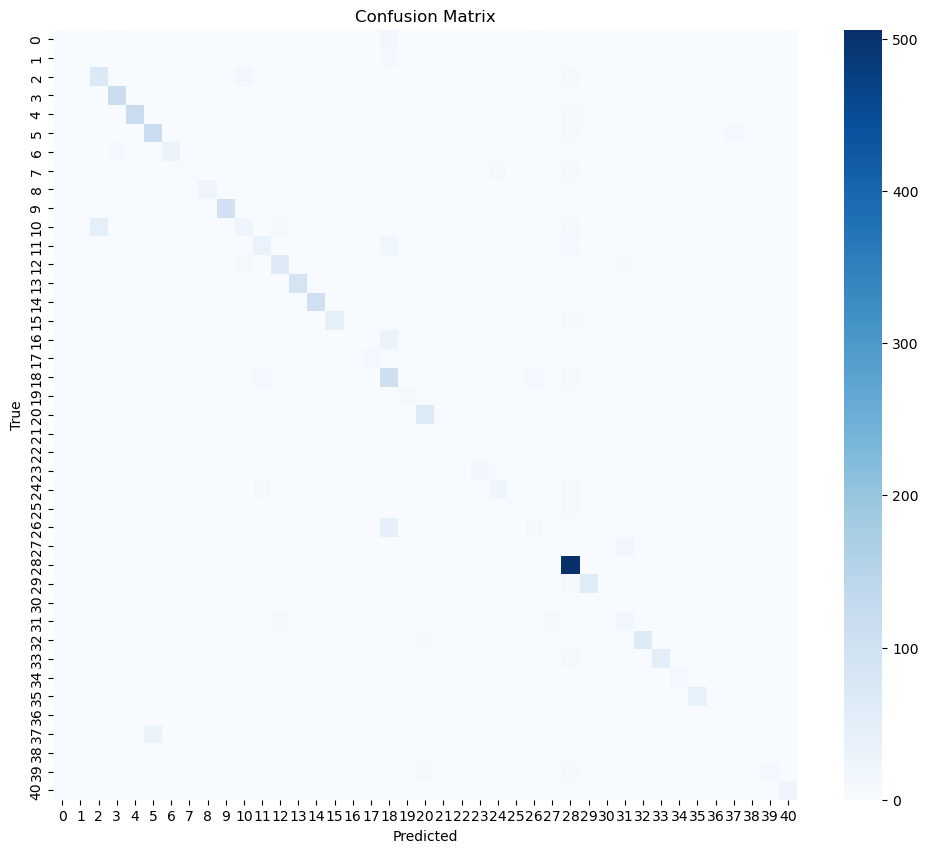

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# === Vectorization ===
vectorizer = TfidfVectorizer(max_features=5000, ngram_range=(1,2))
X_train_vec = vectorizer.fit_transform(X_train)
X_test_vec = vectorizer.transform(X_test)

# === Baseline Classifier ===
clf = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='auto')
clf.fit(X_train_vec, y_train)

# === Predictions ===
y_pred = clf.predict(X_test_vec)

# === Evaluation ===
print("Classification Report:")
target_names = df['label'].astype('category').cat.categories.tolist()
print(classification_report(y_test, y_pred, target_names=target_names))

# === Confusion Matrix ===
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=False, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

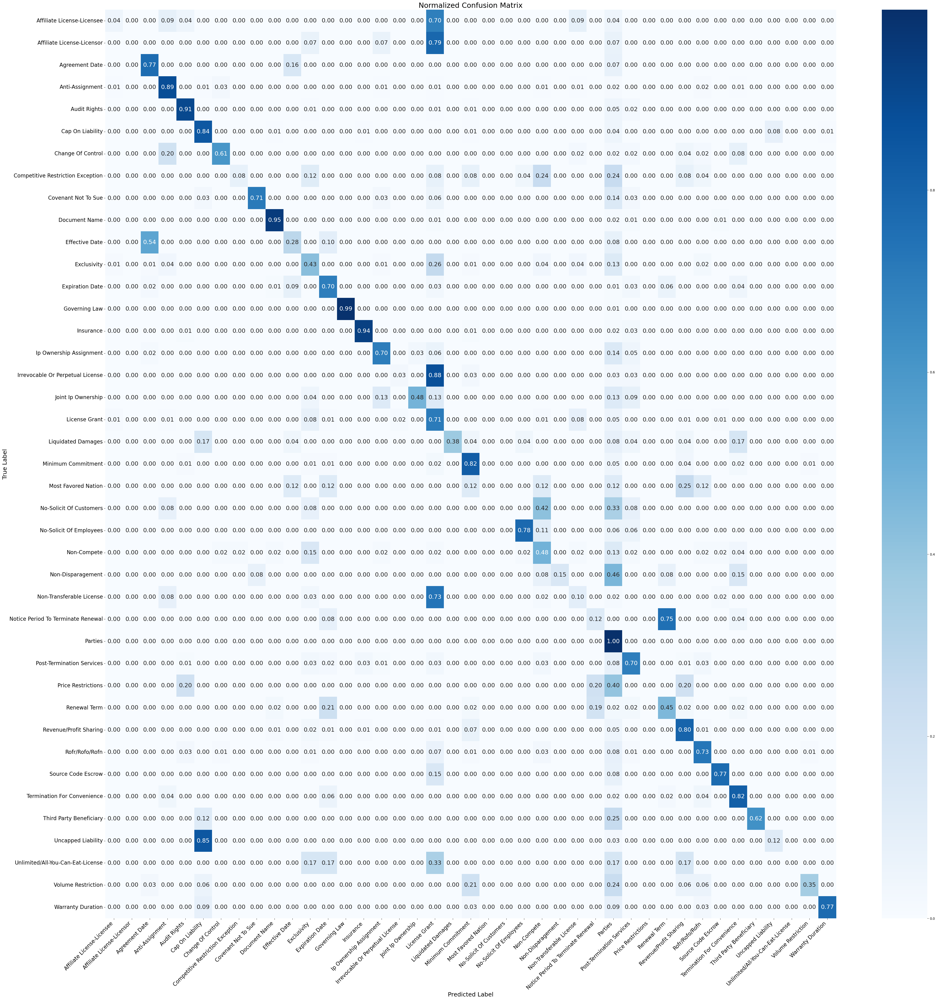


Top positive features for 'Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does the contract contain a license grant to a licensee (incl. sublicensor) and the affiliates of such licensee/sublicensor?':
grants, grant, grant sublicenses, sublicensee, sublicenses, use, group, spinco, sublicense, affiliates
Top negative features for 'Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does the contract contain a license grant to a licensee (incl. sublicensor) and the affiliates of such licensee/sublicensor?':
termination, term, period, event, year, term agreement, notice, shall, parties, interest

Top positive features for 'Highlight the parts (if any) of this contract related to "Affiliate License-Licensor" that should be reviewed by a lawyer. Details: Does the contract contain a license grant by affiliates of the licensor or 

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
import re

# Helper function to shorten labels by extracting text inside quotes
def extract_main_label(full_label):
    match = re.search(r'"([^"]+)"', full_label)
    if match:
        return match.group(1)
    else:
        return full_label[:20] + "..."

# short labels for confusion matrix
short_labels = [extract_main_label(label) for label in target_names]

# 1. Plotting Confusion Matrix with Labels & Normalization (using short labels)
plt.figure(figsize=(50, 50))  
cm = confusion_matrix(y_test, y_pred)
cm_norm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # normalize per true class
sns.heatmap(cm_norm, annot=True, fmt=".2f", cmap="Blues",
            xticklabels=short_labels, yticklabels=short_labels,
            annot_kws={"size": 18})  
plt.title("Normalized Confusion Matrix", fontsize=22)
plt.xlabel("Predicted Label", fontsize=18)
plt.ylabel("True Label", fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=16)
plt.yticks(rotation=0, fontsize=16)
plt.show()

# Feature Importance (Top TF-IDF Features per Class)
def show_top_features(classifier, vectorizer, class_labels, n=10):
    feature_names = vectorizer.get_feature_names_out()
    for i, class_label in enumerate(class_labels):
        coef = classifier.coef_[i]
        top_positive_indices = np.argsort(coef)[-n:]
        top_negative_indices = np.argsort(coef)[:n]
        print(f"\nTop positive features for '{class_label}':")
        print(", ".join(feature_names[top_positive_indices]))
        print(f"Top negative features for '{class_label}':")
        print(", ".join(feature_names[top_negative_indices]))

show_top_features(clf, vectorizer, target_names, n=10)

# Tuning of hyperparameters 
params = {
    'C': [0.1, 1, 10],
    'solver': ['lbfgs', 'liblinear'],
    'max_iter': [1000]
}
grid = GridSearchCV(LogisticRegression(multi_class='auto'), params, cv=3, scoring='f1_weighted')
grid.fit(X_train_vec, y_train)
print("\nBest Params:", grid.best_params_)
print("Best CV F1 Score:", grid.best_score_)

# Re-train model with best params
clf_best = grid.best_estimator_
y_pred_best = clf_best.predict(X_test_vec)
print("\nClassification Report (Best Model):")
print(classification_report(y_test, y_pred_best, target_names=target_names))


Training and evaluating: Logistic Regression
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        precision    recall  f1-score   support

                                                                                                                                                                                                                                                                      Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details:

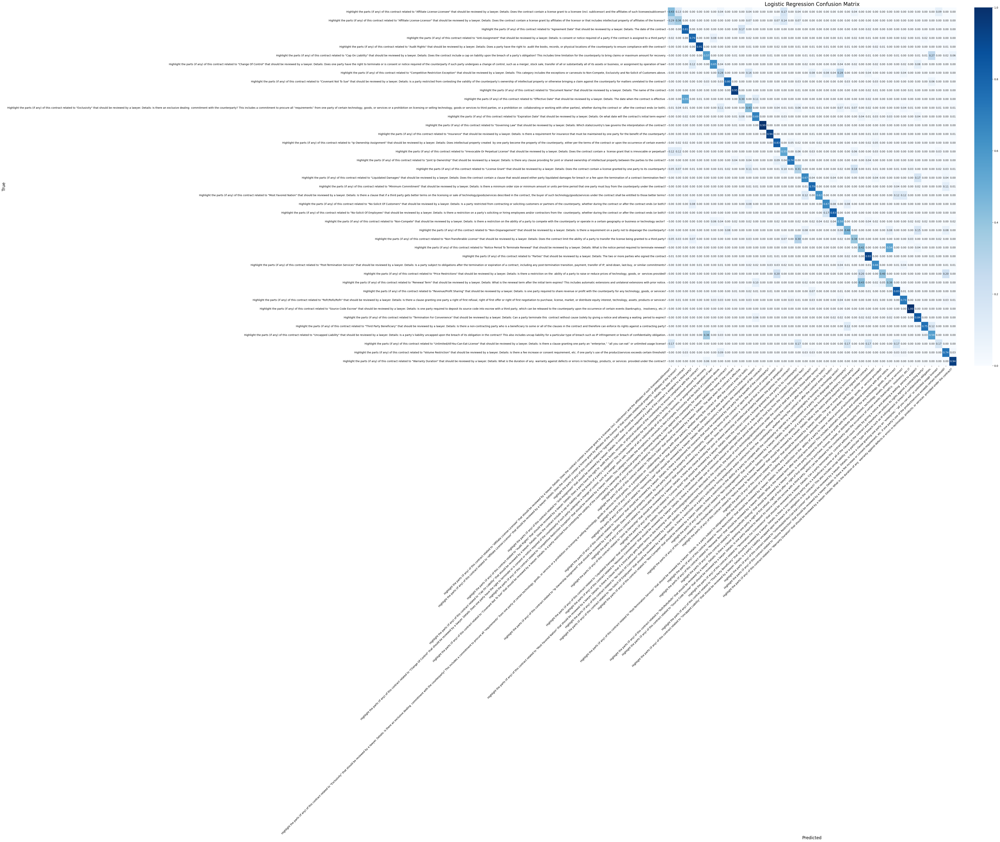


Training and evaluating: Linear SVM
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        precision    recall  f1-score   support

                                                                                                                                                                                                                                                                      Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does the

/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/svm/

5-fold CV Macro F1: 0.6066 (+/- 0.0134)


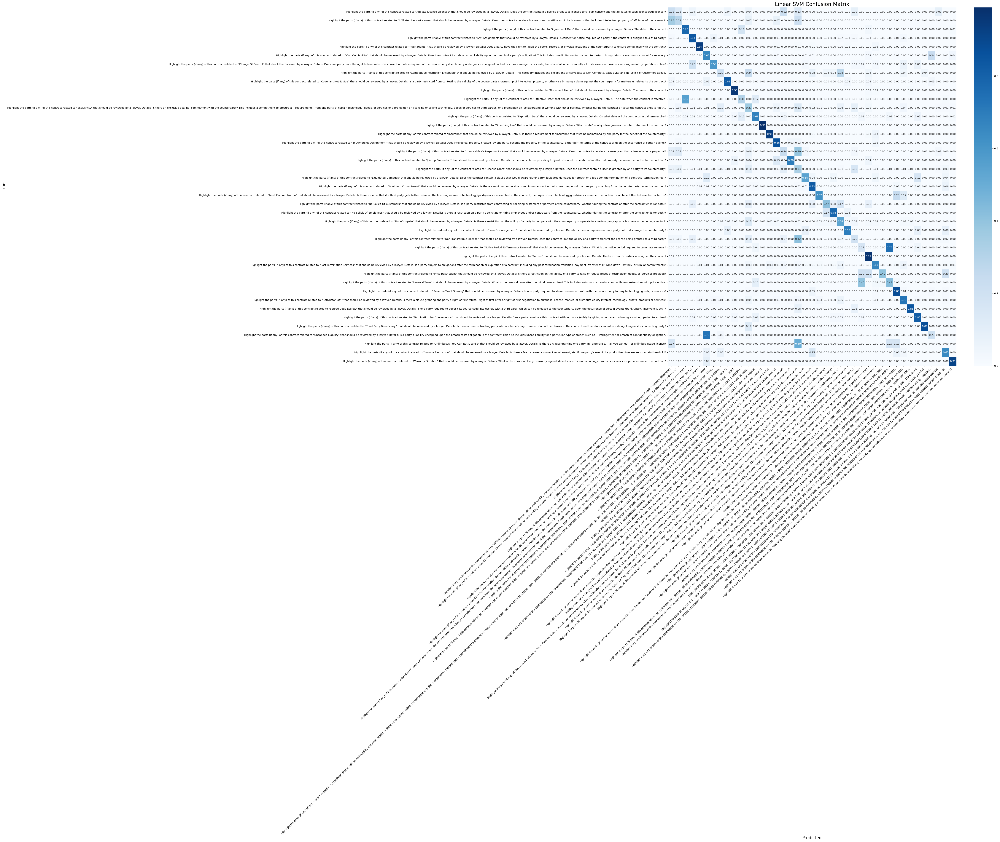


Training and evaluating: Random Forest
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        precision    recall  f1-score   support

                                                                                                                                                                                                                                                                      Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does 

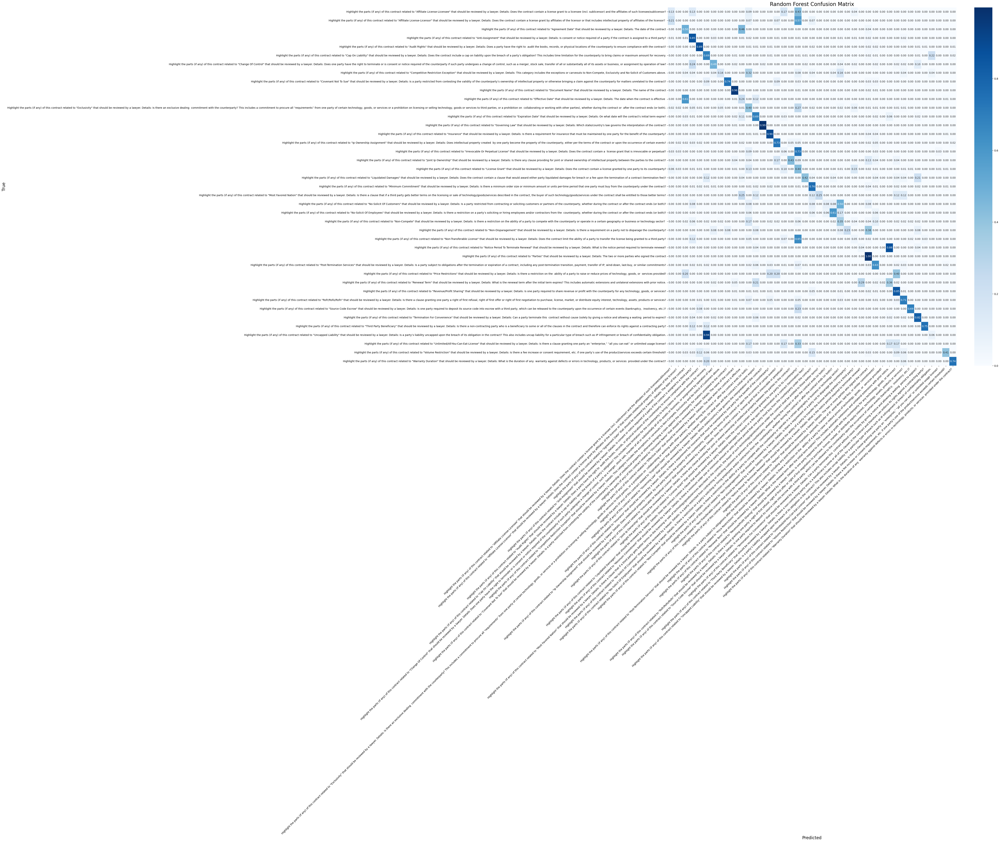


Training and evaluating: Multinomial NB
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        precision    recall  f1-score   support

                                                                                                                                                                                                                                                                      Highlight the parts (if any) of this contract related to "Affiliate License-Licensee" that should be reviewed by a lawyer. Details: Does

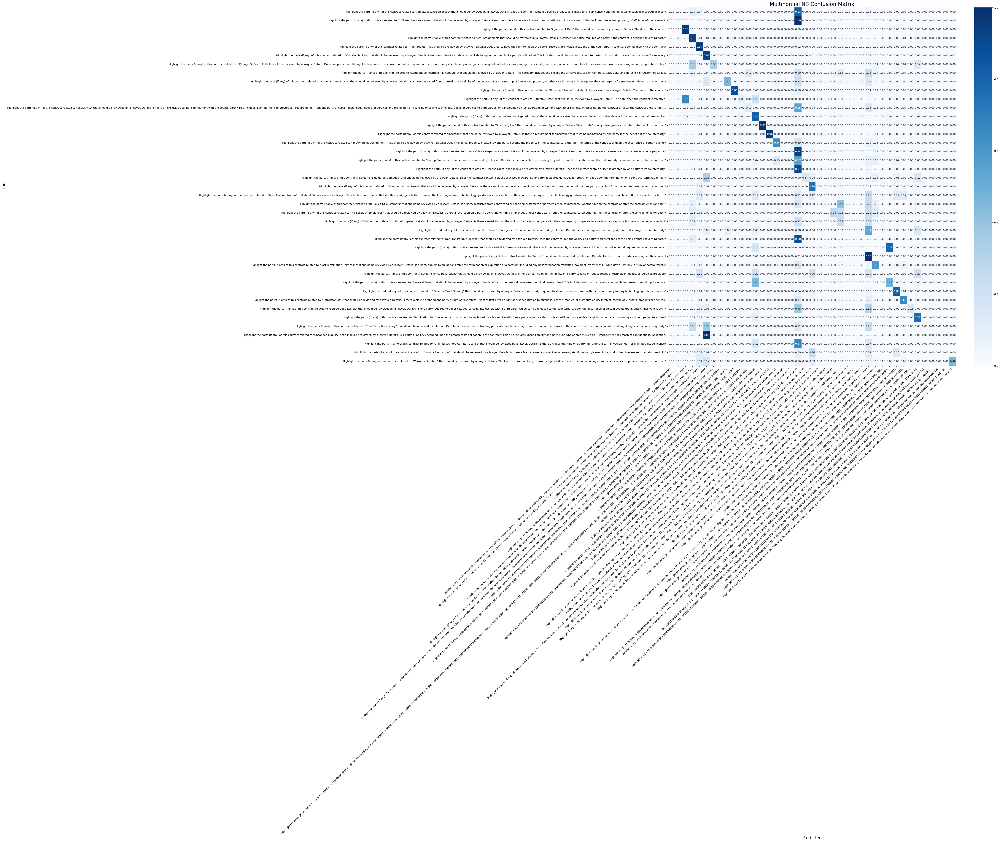


Summary of all models:
                 Model  F1 Macro  Train Time (s)  Pred Time (s)  CV Mean F1  \
0  Logistic Regression  0.612828        1.164491       0.001543    0.611337   
1           Linear SVM  0.599498        0.405653       0.001374    0.606645   
2        Random Forest  0.508191       13.630977       0.133428    0.492701   
3       Multinomial NB  0.395652        0.008643       0.003975    0.382118   

   CV Std F1  
0   0.009631  
1   0.013402  
2   0.011161  
3   0.006034  

Best model based on F1 Macro: Logistic Regression


In [61]:
import time
import warnings
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

warnings.filterwarnings('ignore')  

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='auto', class_weight='balanced', random_state=42),
    "Linear SVM": LinearSVC(max_iter=10000, class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, random_state=42),
    "Multinomial NB": MultinomialNB()
}

results = []
import numpy as np

def plot_cm(y_true, y_pred, labels, title):
    cm = confusion_matrix(y_true, y_pred, normalize='true')
    plt.figure(figsize=(50, 50))
    sns.heatmap(cm, annot=True, fmt=".2f", cmap='Blues', xticklabels=labels, yticklabels=labels)
    plt.title(title, fontsize=20)
    plt.xlabel("Predicted", fontsize=16)
    plt.ylabel("True", fontsize=16)
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.show()

for name, model in models.items():
    print(f"\n{'='*40}\nTraining and evaluating: {name}")
    
    try:
        start_train = time.time()
        model.fit(X_train_vec, y_train)
        end_train = time.time()
        
        start_pred = time.time()
        y_pred_model = model.predict(X_test_vec)
        end_pred = time.time()
    except Exception as e:
        print(f"Error with {name}: {e}")
        continue
    
    print(classification_report(y_test, y_pred_model, target_names=target_names, zero_division=0))
    f1_macro = f1_score(y_test, y_pred_model, average='macro')
    print(f"Macro F1 score: {f1_macro:.4f}")
    print(f"Training time: {end_train - start_train:.2f} seconds")
    print(f"Prediction time: {end_pred - start_pred:.2f} seconds")
    
    cv_scores = cross_val_score(model, X_train_vec, y_train, cv=5, scoring='f1_macro', n_jobs=-1)
    print(f"5-fold CV Macro F1: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")
    
    plot_cm(y_test, y_pred_model, target_names, title=f"{name} Confusion Matrix")
    
    results.append({
        'Model': name,
        'F1 Macro': f1_macro,
        'Train Time (s)': end_train - start_train,
        'Pred Time (s)': end_pred - start_pred,
        'CV Mean F1': cv_scores.mean(),
        'CV Std F1': cv_scores.std()
    })

df_results = pd.DataFrame(results).sort_values(by='F1 Macro', ascending=False)
print("\nSummary of all models:")
print(df_results)

print("\nBest model based on F1 Macro:", df_results.iloc[0]['Model'])
